# Machine Learning Model build up for a Linear Regression containing gas emmissioin dataset


<img src="https://github.com/pathakchiranjit/Machine-Learning/blob/main/LinearRegression/Gas_emission/Pics/pic1.jpg?raw=true"/>


<img src="https://github.com/pathakchiranjit/Machine-Learning/blob/main/LinearRegression/Gas_emission/Pics/pic3.png?raw=true"/>

## Table of Content

1. [Problem Statement](#section1)<br>
2. [Data Loading and Description](#section2)<br>
3. [Exploratory Data Analysis](#section3)<br>
4. [Training and testing the Model](#section4)<br>
    - 4.1 [Splitting data into training and test datasets](#section401)<br>
    	- 4.1.1 [Feature Selection using using Correlation Statistics](#section4011)<br>
    	- 4.1.2 [Feature Selection using Mutual Information Theory](#section4012)<br>
    - 4.2 [Linear regression in scikit-learn](#section402)<br>
    	- 4.2.1 [Model with all features](#section4021)<br>
    	- 4.2.2 [Model Built Using Correlation Features](#section4022)<br>
    	- 4.2.3 [Model Built Using Mutual Information Features](#section4023)<br>
    	- 4.2.4 [Tune the Number of Selected Features : GridSearch](#section4024)<br>
    - 4.3 [Interpreting Model Coefficients](#section403)<br>
    - 4.4 [Using the Model for Prediction](#section404)<br>   
5. [Model evaluation](#section5)<br>
    - 5.1 [Model evaluation using metrics](#section501)<br>
    - 5.2 [Model Evaluation using Rsquared value.](#section502)<br>
6. [Conclusion](#section6)<br>

## 1. Problem Statement

The dataset can be well used for predicting __turbine energy yield (TEY)__ using __ambient variables as features__

In our role as __Data Scientist__ we are asked to suggest.

- We want to find a function that given input as parameters and will __predicts the output__.

- Which __features__ contribute more to __TEY__?

- Visualize the __relationship__ between the _features_ and the _response_ using plots.


## 2. Data Loading and Description

Source:

https://archive.ics.uci.edu/ml/datasets/Gas+Turbine+CO+and+NOx+Emission+Data+Set


### Data Set Information:

The dataset contains __36733 instances__ of __11 sensor measures__ aggregated over one hour (by means of average or sum) from a gas turbine located in __Turkey's north western region__ for the purpose of studying __flue gas emissions__, namely __CO and NOx (NO + NO2)__. 

The data comes from the same power plant as the dataset used for predicting hourly __net energy yield__. 

By contrast, this data is collected in another data range __(01.01.2011 - 31.12.2015)__, includes gas turbine parameters __(such as Turbine Inlet Temperature and Compressor Discharge pressure)__ in addition to the __ambient variables__. 

Note that the dates are not given in the instances but the data are sorted in chronological order. See the attribute information and relevant paper for details. Kindly follow the protocol mentioned in the paper __(using the first three years' data for training/ cross-validation__ and the __last two for testing)__ for reproducibility and comparability of works. 

The dataset can be well used for predicting __turbine energy yield (TEY)__ using ambient variables as features.


### Attribute Information:

The explanations of sensor measurements and their brief statistics are given below.

<img src="https://github.com/pathakchiranjit/Machine-Learning/blob/main/LinearRegression/Gas_emission/Pics/variable_1.JPG?raw=true"/>

__Importing Packages__

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns                                       
%matplotlib inline
sns.set()
pd.set_option('mode.chained_assignment', None)      # To suppress pandas warnings.
pd.set_option('display.max_colwidth', -1)           # To display all the data in each column
pd.options.display.max_columns = 50 

import warnings
warnings.filterwarnings('ignore')

#### Importing the Dataset

In [ ]:
df1 = pd.read_csv('https://raw.githubusercontent.com/pathakchiranjit/Machine-Learning/main/LinearRegression/Gas_emission/Dataset/gt_2011.csv')
df1.head(3)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776


In [ ]:
df2 = pd.read_csv('https://raw.githubusercontent.com/pathakchiranjit/Machine-Learning/main/LinearRegression/Gas_emission/Dataset/gt_2012.csv')
df2.head(3)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,6.8594,1007.9,96.799,3.5000,19.663,1059.2,550.00,114.70,10.605,3.1547,82.722
1,6.7850,1008.4,97.118,3.4998,19.728,1059.3,550.00,114.72,10.598,3.2363,82.776
2,6.8977,1008.8,95.939,3.4824,19.779,1059.4,549.87,114.71,10.601,3.2012,82.468


In [ ]:
df3 = pd.read_csv('https://raw.githubusercontent.com/pathakchiranjit/Machine-Learning/main/LinearRegression/Gas_emission/Dataset/gt_2013.csv')
df3.head(3)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,9.3779,1020.1,90.262,2.3927,19.166,1043.6,541.16,110.16,10.564,9.3472,98.741
1,9.2985,1019.9,89.934,2.3732,19.119,1039.9,538.94,109.23,10.572,11.0160,104.290
2,9.1337,1019.8,89.868,2.3854,19.178,1041.0,539.47,109.62,10.543,10.7500,103.470


In [ ]:
df4 = pd.read_csv('https://raw.githubusercontent.com/pathakchiranjit/Machine-Learning/main/LinearRegression/Gas_emission/Dataset/gt_2014.csv')
df4.head(3)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,8.8358,1022.2,98.762,3.2422,23.152,1067.5,549.94,126.16,11.381,1.9157,68.292
1,9.0529,1021.8,97.464,3.2074,23.207,1067.9,549.80,126.51,11.476,2.0596,68.610
2,9.2464,1021.3,96.494,3.2051,23.296,1068.5,549.89,126.96,11.555,2.1621,68.324


In [ ]:
df5 = pd.read_csv('https://raw.githubusercontent.com/pathakchiranjit/Machine-Learning/main/LinearRegression/Gas_emission/Dataset/gt_2015.csv')
df5.head(3)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,1.95320,1020.1,84.985,2.5304,20.116,1048.7,544.92,116.27,10.799,7.4491,113.250
1,1.21910,1020.1,87.523,2.3937,18.584,1045.5,548.50,109.18,10.347,6.4684,112.020
2,0.94915,1022.2,78.335,2.7789,22.264,1068.8,549.95,125.88,11.256,3.6335,88.147


In [ ]:
data = pd.DataFrame()
lst = [df1, df2, df3,df4,df5] #up to 5 times
for subDF in lst:
    data = pd.concat([data, subDF])
data.head(3)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776


In [ ]:
for subDF in lst:
    print(subDF.shape)

(7411, 11)
(7628, 11)
(7152, 11)
(7158, 11)
(7384, 11)


In [ ]:
data.shape

(36733, 11)

In [ ]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data(data)

,Total,Percent
NOX,0,0.0
CO,0,0.0
CDP,0,0.0
TEY,0,0.0
TAT,0,0.0
TIT,0,0.0
GTEP,0,0.0
AFDP,0,0.0
AH,0,0.0
AP,0,0.0


What are the **features**?
- Nox	
- CO	
- CDP	
- TAT	
- TIT
- GTEP	
- AFDP	
- AH	
- AP	
- AT

What is the **response**?
- 	TEY

## 3. Exploratory Data Analysis

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36733 entries, 0 to 7383
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      36733 non-null  float64
 1   AP      36733 non-null  float64
 2   AH      36733 non-null  float64
 3   AFDP    36733 non-null  float64
 4   GTEP    36733 non-null  float64
 5   TIT     36733 non-null  float64
 6   TAT     36733 non-null  float64
 7   TEY     36733 non-null  float64
 8   CDP     36733 non-null  float64
 9   CO      36733 non-null  float64
 10  NOX     36733 non-null  float64
dtypes: float64(11)
memory usage: 3.4 MB


In [ ]:
data.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000
mean,17.712726,1013.070165,77.867015,3.925518,25.563801,1081.428084,546.158517,133.506404,12.060525,2.372468,65.293067
std,7.447451,6.463346,14.461355,0.773936,4.195957,17.536373,6.842360,15.618634,1.088795,2.262672,11.678357
min,-6.234800,985.850000,24.085000,2.087400,17.698000,1000.800000,511.040000,100.020000,9.851800,0.000388,25.905000
25%,11.781000,1008.800000,68.188000,3.355600,23.129000,1071.800000,544.720000,124.450000,11.435000,1.182400,57.162000
50%,17.801000,1012.600000,80.470000,3.937700,25.104000,1085.900000,549.880000,133.730000,11.965000,1.713500,63.849000
75%,23.665000,1017.000000,89.376000,4.376900,29.061000,1097.000000,550.040000,144.080000,12.855000,2.842900,71.548000
max,37.103000,1036.600000,100.200000,7.610600,40.716000,1100.900000,550.610000,179.500000,15.159000,44.103000,119.910000


In [ ]:
!pip install -U dtale

Requirement already up-to-date: dtale in /usr/local/lib/python3.6/dist-packages (1.21.1)


In [ ]:
import dtale
import dtale.app as dtale_app
dtale_app.USE_COLAB = True

In [ ]:
df = data.copy()

In [ ]:
dtale.show(df, ignore_duplicate=True)

https://ztenfygsbak-496ff2e9c6d22116-40000-colab.googleusercontent.com/dtale/main/1

In [ ]:
!pip install -U pandas-profiling

Requirement already up-to-date: pandas-profiling in /usr/local/lib/python3.6/dist-packages (2.9.0)


In [ ]:
import pandas_profiling 
from pandas_profiling import ProfileReport

In [ ]:
'''#!pip install pandas-profiling                #in case need to download before upgrade

# This to be used for Local environment

profile = ProfileReport(allmatches_df)

#profile = allmatches_df.profile_report(title="ISL_DATA_All_Mateches_before_preprocessing", progress_bar=True, minimal=True)
profile.to_file("ISL_DATA_All_Mateches_before_preprocessing.html")'''

'#!pip install pandas-profiling                #in case need to download before upgrade\n\n# This to be used for Local environment\n\nprofile = ProfileReport(allmatches_df)\n\n#profile = allmatches_df.profile_report(title="ISL_DATA_All_Mateches_before_preprocessing", progress_bar=True, minimal=True)\nprofile.to_file("ISL_DATA_All_Mateches_before_preprocessing.html")'

In [ ]:
# This to be used for Google Collab: profile.to_widgets() not working so used to_notebook_iframe

profile = ProfileReport(data,title='Data_before_preprocessing',html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="DATA_before_preprocessing.html")

In [ ]:
data.columns

Index(['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'CO',
       'NOX'],
      dtype='object')

In [ ]:
columns = data.columns.tolist()
features=[]
for c in columns:
    if c != 'TEY':
      features.append(c)
target ='TEY'
len(features)

10

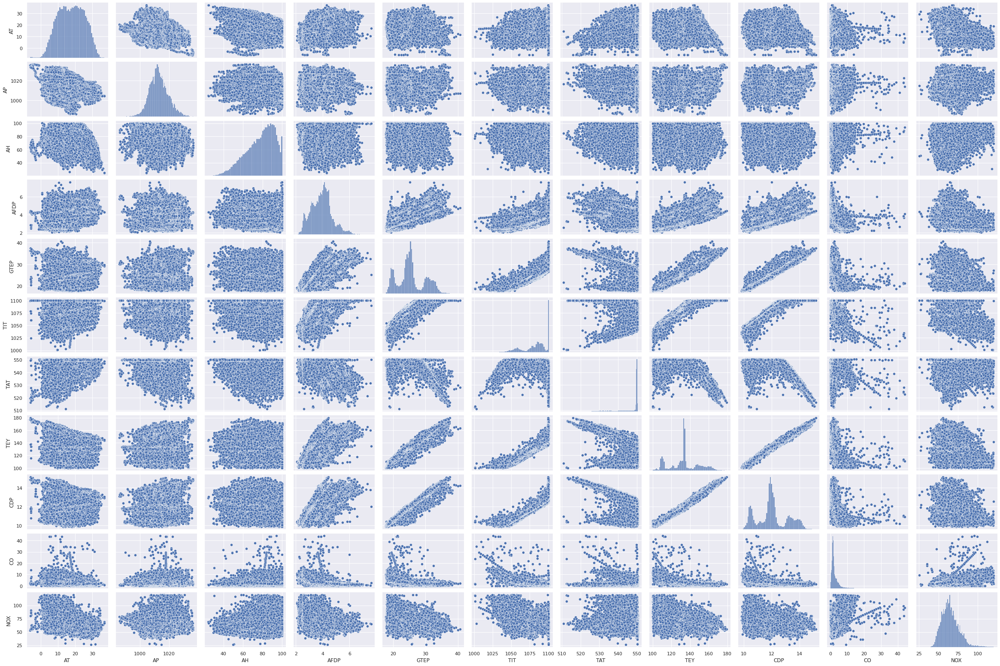

In [ ]:
sns.pairplot(data, height = 2, aspect = 1.5)

__Distribution of Features__

In [ ]:
data.columns

Index(['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'CO',
       'NOX'],
      dtype='object')

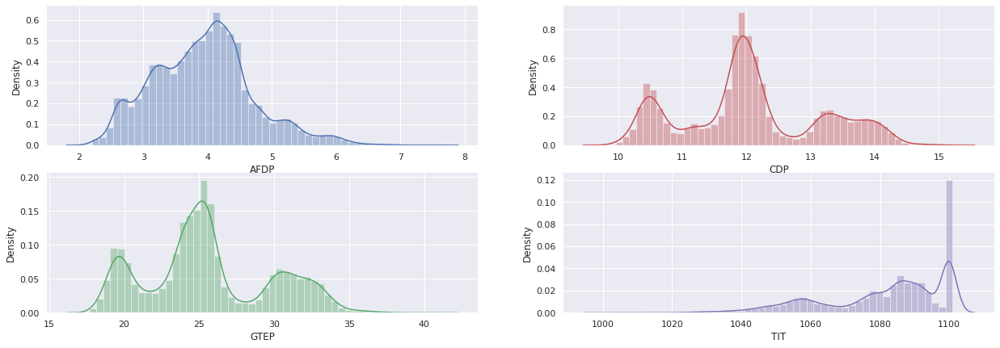

In [ ]:
f, axes = plt.subplots(2, 2, figsize=(21, 7), sharex=False)            # Set up the matplotlib figure
sns.despine(left=True)

sns.distplot(data['AFDP'], color="b", ax=axes[0, 0])

sns.distplot(data['CDP'], color="r", ax=axes[0, 1])

sns.distplot(data['GTEP'], color="g", ax=axes[1, 0])

sns.distplot(data['TIT'], color="m", ax=axes[1, 1])

### Is there a relationship between target and features?

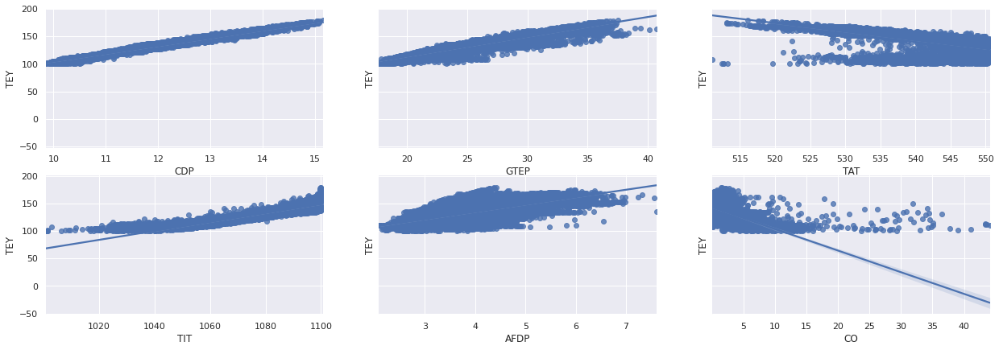

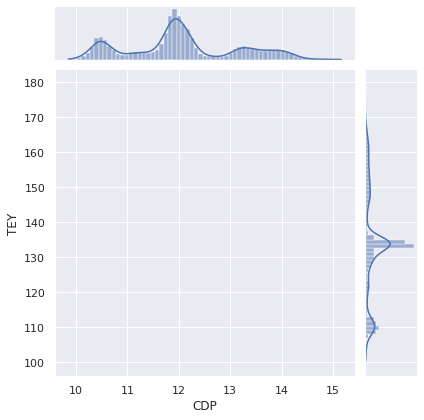

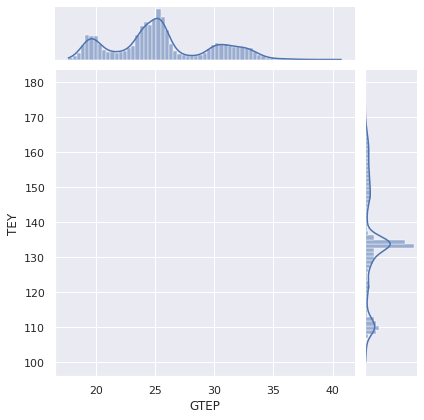

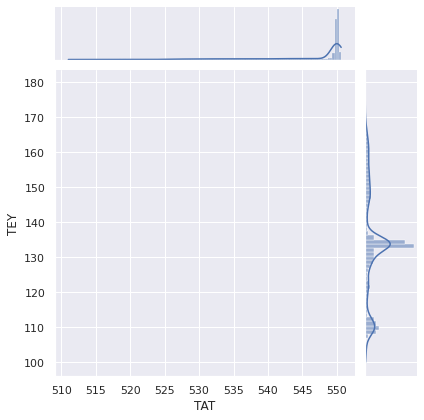

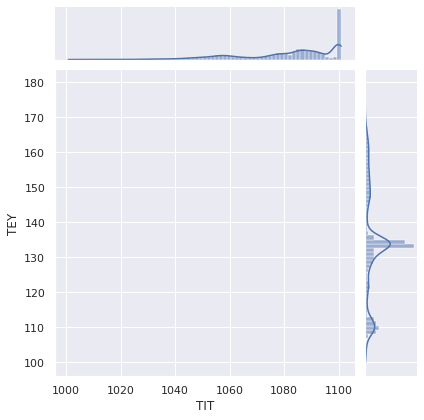

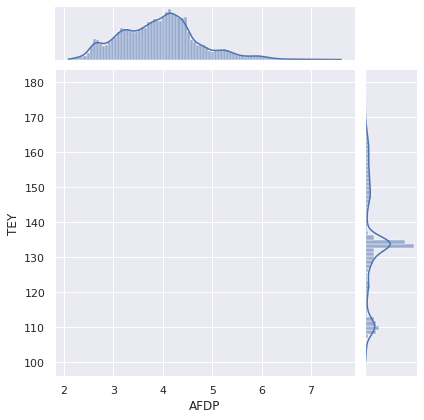

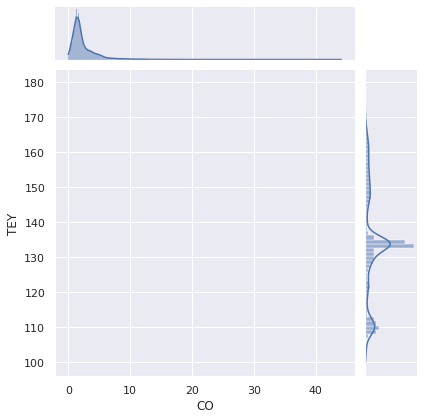

In [ ]:
f, axes = plt.subplots(2,3,figsize=(21, 7), sharex=False, sharey= True)            # Set up the matplotlib figure
sns.despine(left=True)

sns.jointplot("CDP", "TEY", data=data, kind='reg',ax=axes[0, 0])

sns.jointplot("GTEP", "TEY", data=data, kind='reg',ax=axes[0, 1])

sns.jointplot("TAT", "TEY", data=data, kind='reg',ax=axes[0, 2])

sns.jointplot("TIT", "TEY", data=data, kind='reg',ax=axes[1, 0])

sns.jointplot("AFDP", "TEY", data=data, kind='reg',ax=axes[1, 1])

sns.jointplot("CO", "TEY", data=data, kind='reg',ax=axes[1, 2])

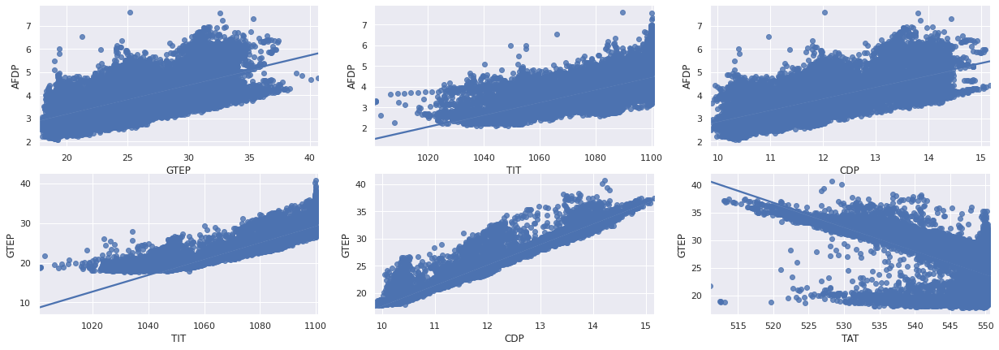

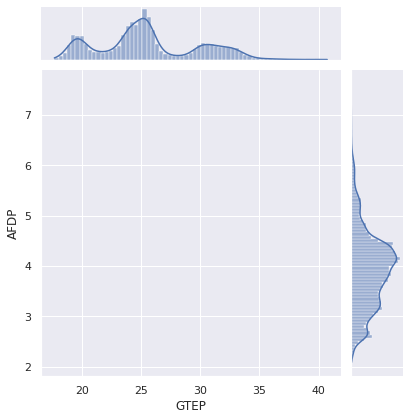

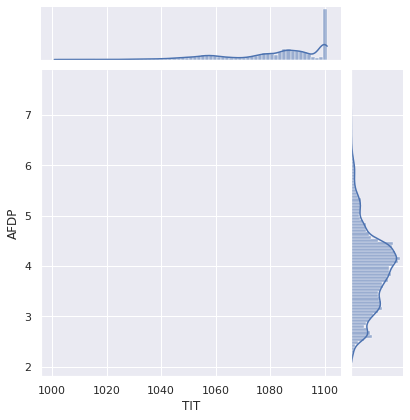

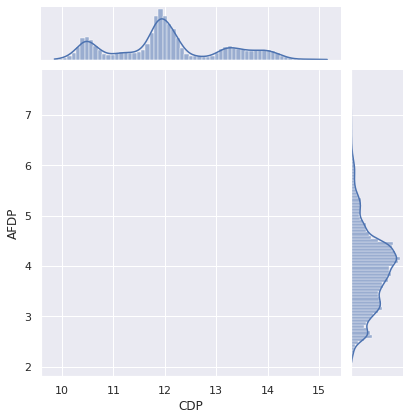

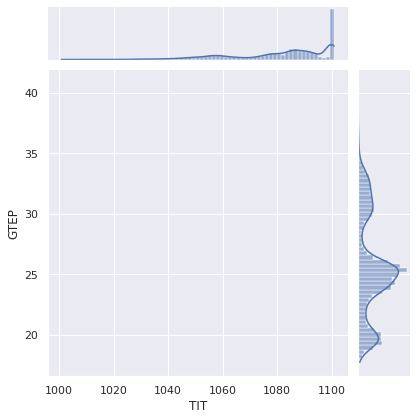

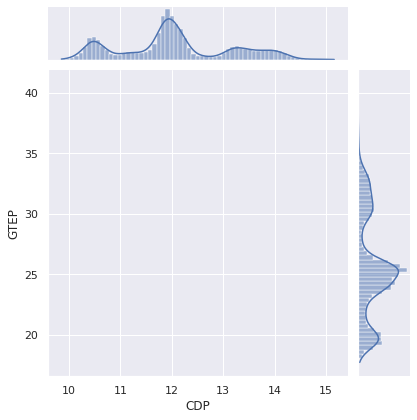

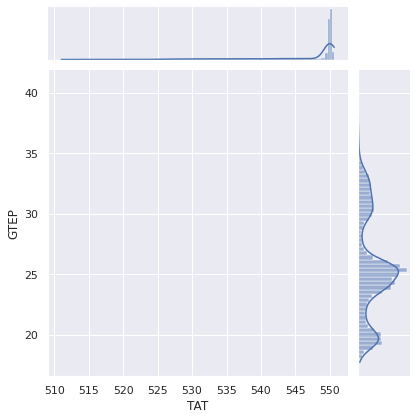

In [ ]:
f, axes = plt.subplots(2,3,figsize=(21, 7), sharex=False, sharey= False)            # Set up the matplotlib figure
sns.despine(left=False)

sns.jointplot("GTEP", "AFDP", data=data, kind='reg',ax=axes[0, 0])

sns.jointplot("TIT", "AFDP", data=data, kind='reg',ax=axes[0, 1])

sns.jointplot("CDP", "AFDP", data=data, kind='reg',ax=axes[0, 2])

sns.jointplot("TIT", "GTEP", data=data, kind='reg',ax=axes[1, 0])

sns.jointplot("CDP", "GTEP", data=data, kind='reg',ax=axes[1, 1])

sns.jointplot("TAT", "GTEP", data=data, kind='reg',ax=axes[1, 2])

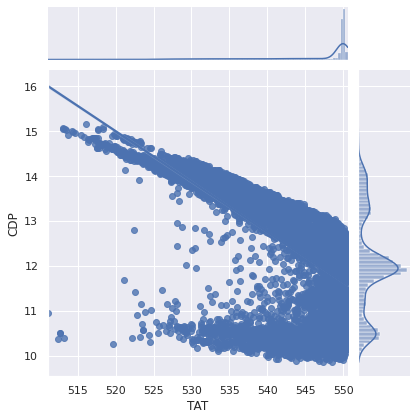

In [ ]:
sns.jointplot("TAT", "CDP", data=data, kind='reg')

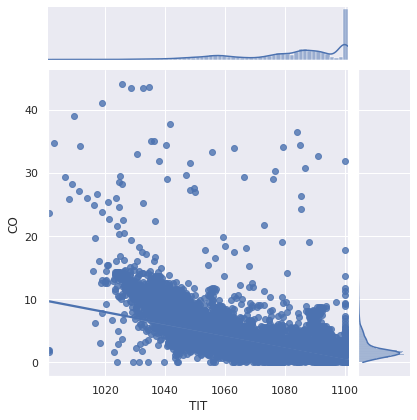

In [ ]:
sns.jointplot("TIT", "CO", data=data, kind='reg')

### Visualising Pairwise correlation

In [ ]:
data.corr()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
AT,1.000000,-0.406601,-0.476291,0.251974,0.045851,0.183706,0.281869,-0.091152,0.015287,-0.174326,-0.558174
AP,-0.406601,1.000000,-0.015184,-0.040363,0.057533,-0.005390,-0.225601,0.118224,0.102636,0.067050,0.191938
AH,-0.476291,-0.015184,1.000000,-0.147840,-0.235153,-0.221809,0.022965,-0.137360,-0.196275,0.106586,0.164617
AFDP,0.251974,-0.040363,-0.147840,1.000000,0.678485,0.691292,-0.466882,0.665483,0.702568,-0.448425,-0.188247
GTEP,0.045851,0.057533,-0.235153,0.678485,1.000000,0.874234,-0.699703,0.964127,0.978470,-0.518909,-0.201630
TIT,0.183706,-0.005390,-0.221809,0.691292,0.874234,1.000000,-0.380862,0.910297,0.908469,-0.706275,-0.213865
TAT,0.281869,-0.225601,0.022965,-0.466882,-0.699703,-0.380862,1.000000,-0.682396,-0.706438,0.058353,-0.092791
TEY,-0.091152,0.118224,-0.137360,0.665483,0.964127,0.910297,-0.682396,1.000000,0.988778,-0.569813,-0.116127
CDP,0.015287,0.102636,-0.196275,0.702568,0.978470,0.908469,-0.706438,0.988778,1.000000,-0.551027,-0.171256
CO,-0.174326,0.067050,0.106586,-0.448425,-0.518909,-0.706275,0.058353,-0.569813,-0.551027,1.000000,0.340606


__Observation__

- Strong and negetive relationship between km and target
- Positive and less relationship between on road old & on road now and target
- Very weak to no relationship between others and target



### Calculating and plotting heatmap correlation

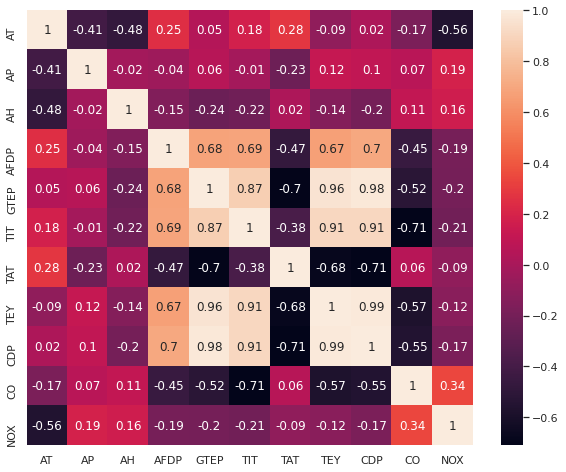

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(round(data.corr(),2),annot=True)
plt.show()

__Observation__

- __Few features are highly correlated among each other__.

- Variables with __strong correlations__ with __Target__ are mostly probably candidates for __model builing__.


## 4. Training and Testing the Model

### 4.1 Splitting data into training and test datasets.

In [ ]:
data_train = pd.DataFrame()
lst = [df1, df2, df3] #up to first 3 years
for subDF in lst:
    data_train = pd.concat([data_train, subDF])
data_train.head(3)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776


In [ ]:
data_test = pd.DataFrame()
lst = [df4, df5] #up to first 3 years
for subDF in lst:
    data_test = pd.concat([data_test, subDF])
data_test.head(3)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,8.8358,1022.2,98.762,3.2422,23.152,1067.5,549.94,126.16,11.381,1.9157,68.292
1,9.0529,1021.8,97.464,3.2074,23.207,1067.9,549.80,126.51,11.476,2.0596,68.610
2,9.2464,1021.3,96.494,3.2051,23.296,1068.5,549.89,126.96,11.555,2.1621,68.324


In [ ]:
print(data_train.shape, data_test.shape)

(22191, 11) (14542, 11)


In [ ]:
X_train = data_train[features]
y_train = data_train[target]
print(X_train.shape,y_train.shape)

(22191, 10) (22191,)


In [ ]:
X_test = data_test[features]
y_test = data_test[target]
print(X_test.shape,y_test.shape)

(14542, 10) (14542,)


In [ ]:
data[target]

0       134.67
1       134.67
2       135.10
3       135.03
4       134.67
         ...  
7379    109.08
7380    108.79
7381    107.81
7382    131.41
7383    125.41
Name: TEY, Length: 36733, dtype: float64

### 4.1.1 Feature Selection using Correlation Statistics

- Feature selection to be done specifically to manage the high correlation among some of the features.

<img src="https://github.com/pathakchiranjit/Machine-Learning/blob/main/LinearRegression/Gas_emission/Pics/feature_1.jpg?raw=true" />

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

Feature 0: 860.624004
Feature 1: 718.013902
Feature 2: 293.925853
Feature 3: 15789.036161
Feature 4: 496027.685586
Feature 5: 95289.882724
Feature 6: 23891.083505
Feature 7: 1005912.467434
Feature 8: 11633.388290
Feature 9: 67.526325


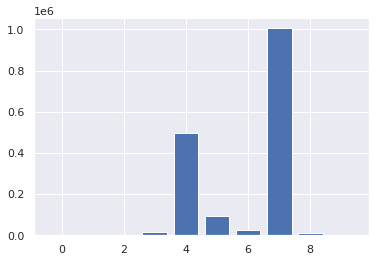

In [ ]:
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=f_regression, k='all')
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

So 3-4 features are having hi impact on the model 

### 4.1.2 Feature Selection using Mutual Information Theory

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression

Feature 0: 0.350695
Feature 1: 0.109091
Feature 2: 0.073849
Feature 3: 0.483484
Feature 4: 1.552201
Feature 5: 1.304723
Feature 6: 0.874199
Feature 7: 1.699531
Feature 8: 0.509502
Feature 9: 0.272761


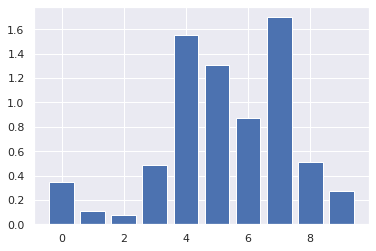

In [ ]:
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_regression, k='all')
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

So 7-8 features are having impact on the model 

### 4.2 Linear regression in scikit-learn

### 4.2.1 Model with all features

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_error as MSE

In [ ]:
# fit the model
model = LinearRegression()
model.fit(X_train, y_train)
# evaluate the model
yhat = model.predict(X_test)
# evaluate predictions
mae = MAE(y_test, yhat)
rmse = np.sqrt(MSE(y_test, yhat))
print('MAE: %.3f' % mae)
print('RMSE: %.3f' % rmse)

MAE: 2.952
RMSE: 3.125


In [ ]:
from sklearn.metrics import r2_score 
p = X_test.shape[1]
n = len(X_test)  
r2_scor = r2_score(y_test, yhat)  
adj_r2_score = 1-(1-r2_scor)*((n-1)/(n-p-1)) 
print(" R2_score = {} \n Adj_R2_score {}".format (r2_scor,adj_r2_score))

 R2_score = 0.9564589226019838 
 Adj_R2_score 0.9564289583342817


In [ ]:
# evaluate the model train
y_pred_train = model.predict(X_train)
# evaluate predictions train
mae = MAE(y_train, y_pred_train)
rmse = np.sqrt(MSE(y_train, y_pred_train))
print('MAE: %.3f' % mae)
print('RMSE: %.3f' % rmse)

MAE: 0.532
RMSE: 0.744


### 4.2.2 Model Built Using Correlation Features

---



In [ ]:
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select a subset of features
	fs = SelectKBest(score_func=f_regression, k=3)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# fit the model
model = LinearRegression()
model.fit(X_train_fs, y_train)
# evaluate the model
yhat = model.predict(X_test_fs)
# evaluate predictions
mae = MAE(y_test, yhat)
rmse = np.sqrt(MSE(y_test, yhat))
print('MAE: %.3f' % mae)
print('RMSE: %.3f' % rmse)

MAE: 2.339
RMSE: 3.154


In [ ]:
X_train_fs

array([[  23.979, 1086.2  ,   11.898],
       [  23.951, 1086.1  ,   11.892],
       [  23.99 , 1086.5  ,   12.042],
       ...,
       [  34.165, 1099.9  ,   14.395],
       [  33.802, 1100.1  ,   14.343],
       [  33.768, 1100.   ,   14.291]])

In [ ]:
# evaluate the model train
y_pred_train = model.predict(X_train_fs)
# evaluate predictions train
mae = MAE(y_train, y_pred_train)
rmse = np.sqrt(MSE(y_train, y_pred_train))
print('MAE: %.3f' % mae)
print('RMSE: %.3f' % rmse)

MAE: 1.765
RMSE: 2.187


In [ ]:
from sklearn.metrics import r2_score 
p = 1
n = len(X_test)  
r2_scor = r2_score(y_test, yhat)  
adj_r2_score = 1-(1-r2_scor)*((n-1)/(n-p-1)) 
print(" R2_score = {} \n Adj_R2_score {}".format (r2_scor,adj_r2_score))

 R2_score = 0.9556361701649241 
 Adj_R2_score 0.9556331190074389


### 4.2.3 Model Built Using Mutual Information Features

In [ ]:
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select a subset of features
	fs = SelectKBest(score_func=mutual_info_regression, k=3)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# fit the model
model = LinearRegression()
model.fit(X_train_fs, y_train)
# evaluate the model
yhat = model.predict(X_test_fs)
# evaluate predictions
mae = MAE(y_test, yhat)
rmse = np.sqrt(MSE(y_test, yhat))
print('MAE: %.3f' % mae)
print('RMSE: %.3f' % rmse)

MAE: 2.339
RMSE: 3.154


In [ ]:
X_train_fs

array([[  23.979, 1086.2  ,   11.898],
       [  23.951, 1086.1  ,   11.892],
       [  23.99 , 1086.5  ,   12.042],
       ...,
       [  34.165, 1099.9  ,   14.395],
       [  33.802, 1100.1  ,   14.343],
       [  33.768, 1100.   ,   14.291]])

In [ ]:
# evaluate the model train
y_pred_train = model.predict(X_train_fs)
# evaluate predictions train
mae = MAE(y_train, y_pred_train)
rmse = np.sqrt(MSE(y_train, y_pred_train))
print('MAE: %.3f' % mae)
print('RMSE: %.3f' % rmse)

MAE: 1.765
RMSE: 2.187


In [ ]:
from sklearn.metrics import r2_score 
p = 10
n = len(X_test)  
r2_scor = r2_score(y_test, yhat)  
adj_r2_score = 1-(1-r2_scor)*((n-1)/(n-p-1)) 
print(" R2_score = {} \n Adj_R2_score {}".format (r2_scor,adj_r2_score))

 R2_score = 0.9556361701649241 
 Adj_R2_score 0.9556056396922552


### 4.2.4 Tune the Number of Selected Features : GridSearch

In [ ]:
from sklearn.model_selection import RepeatedKFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

In [ ]:
X_train.shape[1]-8

2

In [ ]:
from sklearn import metrics
sorted(metrics.SCORERS.keys())

In [ ]:
# define the evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=2, random_state=1)
# define the pipeline to evaluate
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])
# define the grid
grid = dict()
grid['sel__k'] = [i for i in range(X_train.shape[1]-9, X_train.shape[1]+1)]
# define the grid search
search = GridSearchCV(pipeline, grid, scoring='neg_mean_absolute_error', n_jobs=-1, cv=cv)   # In this case, we will evaluate models using the negative mean absolute error (neg_mean_absolute_error). It is negative because the scikit-learn requires the score to be maximized, so the MAE is made negative, meaning scores scale from -infinity to 0 (best).
# perform the search
results = search.fit(X_train, y_train)
# summarize best
print('Best MAE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best MAE: -0.532
Best Config: {'sel__k': 10}
>-1.906 with: {'sel__k': 1}
>-1.782 with: {'sel__k': 2}
>-1.765 with: {'sel__k': 3}
>-1.491 with: {'sel__k': 4}
>-1.481 with: {'sel__k': 5}
>-1.452 with: {'sel__k': 6}
>-0.598 with: {'sel__k': 7}
>-0.596 with: {'sel__k': 8}
>-0.532 with: {'sel__k': 9}
>-0.532 with: {'sel__k': 10}


>1 -1.906 (0.023)
>2 -1.782 (0.022)
>3 -1.765 (0.024)
>4 -1.491 (0.025)
>5 -1.481 (0.023)
>6 -1.452 (0.024)
>7 -0.598 (0.013)
>8 -0.596 (0.013)
>9 -0.532 (0.012)
>10 -0.532 (0.011)


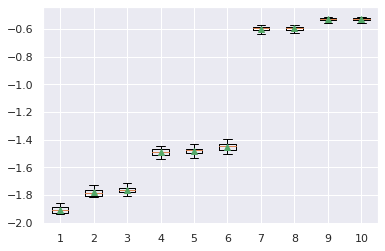

In [ ]:
from sklearn.model_selection import cross_val_score
# define number of features to evaluate
num_features = [i for i in range(X_train.shape[1]-9, X_train.shape[1]+1)]
# enumerate each number of features
results1 = list()
for k in num_features:
	# create pipeline
	model = LinearRegression()
	fs = SelectKBest(score_func=mutual_info_regression, k=k)
	pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])
	# evaluate the model
	cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
	scores = cross_val_score(pipeline,  X_train, y_train, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
	results1.append(scores)
	# summarize the results
	print('>%d %.3f (%.3f)' % (k, np.mean(scores), np.std(scores)))
# plot model performance for comparison
plt.boxplot(results1, labels=num_features, showmeans=True)
plt.show()

>1 1.903 (2.303)
>2 2.357 (3.245)
>3 2.339 (3.154)
>4 8.243 (9.282)
>5 8.221 (9.256)
>6 7.916 (8.882)
>7 2.461 (2.683)
>8 2.333 (2.560)
>9 3.070 (3.238)
>10 2.952 (3.125)


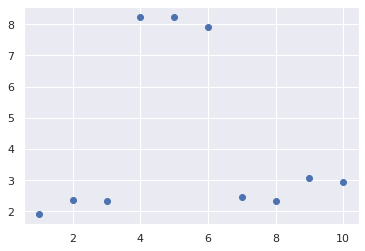

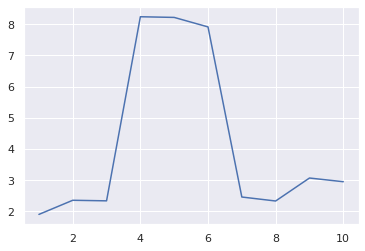

In [ ]:
# feature selection
def select_features_model(X_train, y_train, X_test,k):
	# configure to select a subset of features
	fs = SelectKBest(score_func=mutual_info_regression, k=k)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# define number of features to evaluate
num_features = [i for i in range(X_train.shape[1]-9, X_train.shape[1]+1)]
# enumerate each number of features
results_mae_tst = list()
results_rmse_tst = list()
for k in num_features:
  # feature selection
  X_train_fs, X_test_fs, fs = select_features_model(X_train, y_train, X_test,k)
  # fit the model
  model = LinearRegression()
  model.fit(X_train_fs, y_train)
  # evaluate the model
  yhat = model.predict(X_test_fs)
  # evaluate predictions
  mae = MAE(y_test, yhat)
  rmse = np.sqrt(MSE(y_test, yhat))
  results_mae_tst.append(mae)
  results_rmse_tst.append(rmse)
	# summarize the results
  print('>%d %.3f (%.3f)' % (k, mae, rmse))
# plot model performance for comparison
plt.scatter(num_features, results_mae_tst)
plt.show()
plt.plot(num_features, results_mae_tst)
plt.show()

>1 1.905 (2.354)
>2 1.782 (2.218)
>3 1.765 (2.187)
>4 1.490 (1.901)
>5 1.481 (1.888)
>6 1.451 (1.859)
>7 0.597 (0.817)
>8 0.595 (0.808)
>9 0.532 (0.747)
>10 0.532 (0.744)


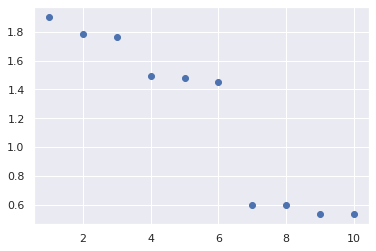

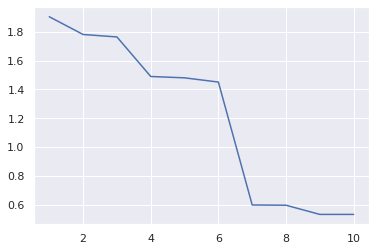

In [ ]:
# feature selection
def select_features_model(X_train, y_train, X_test,k):
	# configure to select a subset of features
	fs = SelectKBest(score_func=mutual_info_regression, k=k)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# define number of features to evaluate
num_features = [i for i in range(X_train.shape[1]-9, X_train.shape[1]+1)]
# enumerate each number of features
results_mae_tr = list()
results_rmse_tr = list()
for k in num_features:
  # feature selection
  X_train_fs, X_test_fs, fs = select_features_model(X_train, y_train, X_test,k)
  # fit the model
  model = LinearRegression()
  model.fit(X_train_fs, y_train)
  # evaluate the model
  yhat = model.predict(X_train_fs)
  # evaluate predictions
  mae = MAE(y_train, yhat)
  rmse = np.sqrt(MSE(y_train, yhat))
  results_mae_tr.append(mae)
  results_rmse_tr.append(rmse)
	# summarize the results
  print('>%d %.3f (%.3f)' % (k, mae, rmse))
# plot model performance for comparison
plt.scatter(num_features, results_mae_tr)
plt.show()
plt.plot(num_features, results_mae_tr)
plt.show()

In [ ]:
num_features

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [ ]:
model_eva=pd.concat([pd.DataFrame(num_features),pd.DataFrame(results_mae_tr), pd.DataFrame(results_rmse_tr),pd.DataFrame(results_mae_tst), pd.DataFrame(results_rmse_tst)],axis=1)
model_eva.columns = ['Feature_number','MAE_Training','RMSE_Training','MAE_Test', 'RMSE_test']
model_eva

,Feature_number,MAE_Training,RMSE_Training,MAE_Test,RMSE_test
0,1,1.905447,2.354340,1.903045,2.302691
1,2,1.782063,2.218478,2.356738,3.244547
2,3,1.765120,2.187249,2.338517,3.154224
3,4,1.490215,1.900632,8.242611,9.281714
4,5,1.480846,1.888095,8.220992,9.255912
5,6,1.451452,1.859275,7.916408,8.881514
6,7,0.597309,0.817165,2.461045,2.682705
7,8,0.595421,0.807878,2.333199,2.559623
8,9,0.531623,0.746790,3.070164,3.237879
9,10,0.531585,0.744256,2.951597,3.124839


In [ ]:
model_eva.set_index(model_eva.Feature_number,inplace=True)
model_eva.drop(columns='Feature_number',inplace=True)
model_eva.head(3)

,MAE_Training,RMSE_Training,MAE_Test,RMSE_test
Feature_number,,,,
1,1.905447,2.354340,1.903045,2.302691
2,1.782063,2.218478,2.356738,3.244547
3,1.765120,2.187249,2.338517,3.154224


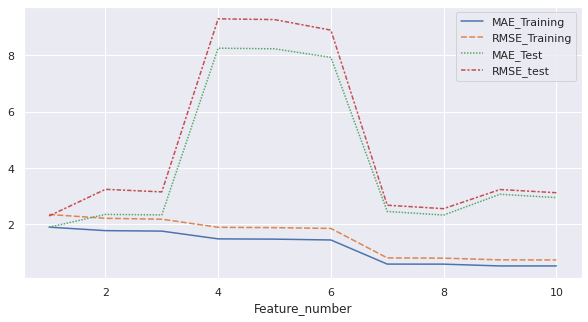

In [ ]:
plt.figure(figsize = (10,5))
sns.set(style='darkgrid',)
sns.lineplot(data=model_eva)

### So CDP has been choosen based on the fact that the MAE/RMSE are in same level for both the Train & Test datasets together.

In [ ]:
print (data[target].mean(),y_train.mean(),y_test.mean())

133.50640350638446 133.53739308728888 133.45911360198016


In [ ]:
data_train.head(3)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776


In [ ]:
X_train=(pd.DataFrame(data_train.CDP))
X_test=pd.DataFrame(data_test.CDP)
y_train=pd.DataFrame(data_train.TEY)
y_test=pd.DataFrame(data_test.TEY)

In [ ]:
#Instantiating the model
from sklearn.linear_model import LinearRegression
lr_model = LinearRegression(fit_intercept=True)

In [ ]:
y_train.head(3)

0    134.67
1    134.67
2    135.10
Name: TEY, dtype: float64

In [ ]:
lr_model.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

### 4.3 Interpreting Model Coefficients

In [ ]:
print('Intercept:',lr_model.intercept_)          # print the intercept 
print('Coefficients:',lr_model.coef_)  

Intercept: [-38.03858845]
Coefficients: [[14.22661917]]


In [ ]:
X_train.columns

Index(['CDP'], dtype='object')

In [ ]:
(lr_model.coef_).T

array([[14.22661917]])

In [ ]:
coef1=pd.DataFrame((lr_model.coef_).T,index=X_train.columns,\
             columns=['Co-efficients']).sort_values('Co-efficients',ascending=False)
coef1

,Co-efficients
CDP,14.226619


In [ ]:
coef1['converted'] = 100* coef1['Co-efficients'].abs()/(coef1['Co-efficients'].abs().sum())
coef1

,Co-efficients,converted
CDP,14.226619,100.0


__TEY = -38.03 + 14.227 `*` CDP__

How do we interpret the coefficient (+14.227)
- A "unit" increase in __CDP__ is **associated with** a __"14.227__ unit" increase in __TEY__.

### 4.4 Using the Model for Prediction

In [ ]:
y_pred_train = lr_model.predict(X_train)  

In [ ]:
y_pred_train

array([[131.22972647],
       [131.14436676],
       [133.27835963],
       ...,
       [166.75359455],
       [166.01381035],
       [165.27402615]])

In [ ]:
y_pred_test = lr_model.predict(X_test)                                  # make predictions on the testing set

In [ ]:
y_pred_test

array([[123.87456436],
       [125.22609318],
       [126.34999609],
       ...,
       [110.80030134],
       [129.42294584],
       [125.02692051]])

- We need an evaluation metric in order to compare our predictions with the actual values.

<a id=section5></a>

## 5. Model evaluation 

__Error__ is the _deviation_ of the values _predicted_ by the model with the _true_ values.<br/>
For example, if a model predicts that the price of apple is Rs75/kg, but the actual price of apple is Rs100/kg, then the error in prediction will be Rs25/kg.<br/>
Below are the types of error we will be calculating for our _linear regression model_:
- Mean Absolute Error
- Mean Squared Error
- Root Mean Squared Error

### 5.1 Model Evaluation using __metrics.__

__Mean Absolute Error__ (MAE) is the mean of the absolute value of the errors:
$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$
Computing the MAE for our target predictions

In [ ]:
from sklearn import metrics
MAE_train = metrics.mean_absolute_error(y_train, y_pred_train)
MAE_test = metrics.mean_absolute_error(y_test, y_pred_test)

In [ ]:
print('MAE for training set is {}'.format(MAE_train))
print('MAE for test set is {}'.format(MAE_test))

MAE for training set is 1.9054465760730919
MAE for test set is 1.9030451554025525


__Mean Squared Error__ (MSE) is the mean of the squared errors:
$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

Computing the MSE for our target predictions

In [ ]:
MSE_train = metrics.mean_squared_error(y_train, y_pred_train)
MSE_test = metrics.mean_squared_error(y_test, y_pred_test)

In [ ]:
print('MSE for training set is {}'.format(MSE_train))
print('MSE for test set is {}'.format(MSE_test))

MSE for training set is 5.54291555864376
MSE for test set is 5.302387321667005


__Root Mean Squared Error__ (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

Computing the RMSE for our target predictions

In [ ]:
RMSE_train = np.sqrt( metrics.mean_squared_error(y_train, y_pred_train))
RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))

In [ ]:
print('RMSE for training set is {}'.format(RMSE_train))
print('RMSE for test set is {}'.format(RMSE_test))

RMSE for training set is 2.3543397288080072
RMSE for test set is 2.302691321403502


In [ ]:
data['TEY'].mean()

133.50640350638446

In [ ]:
RMSE_test/data['TEY'].mean()

0.017247796816677666

Comparing these metrics:
- __RMSE__ is more popular than MSE, because RMSE is _interpretable_ in the "y" units.
    - Easier to put in context as it's the same units as our response variable.

In [ ]:
import statsmodels.api as sm
from scipy import stats

In [ ]:
X=X_train
y=y_train
X2 = sm.add_constant(X) 
est = sm.OLS(y, X2)
est2 = est.fit()
X2=sm.add_constant(X_test)
y=y_test
predictions = est2.predict(X2)
print(predictions)
print("r2_score",metrics.r2_score(y,predictions))

0       123.874564
1       125.226093
2       126.349996
3       126.122370
4       125.339906
           ...    
7379    110.074744
7380    109.121560
7381    110.800301
7382    129.422946
7383    125.026921
Length: 14542, dtype: float64
r2_score 0.9763563035673102


In [ ]:
print("summary()\n",est2.summary())
print("pvalues\n",est2.pvalues)
print("tvalues\n",est2.tvalues)
print("rsquared\n",est2.rsquared)
print("rsquared_adj\n",est2.rsquared_adj)

summary()
                             OLS Regression Results                            
Dep. Variable:                    TEY   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                 1.006e+06
Date:                Sat, 14 Nov 2020   Prob (F-statistic):               0.00
Time:                        11:21:22   Log-Likelihood:                -50489.
No. Observations:               22191   AIC:                         1.010e+05
Df Residuals:                   22189   BIC:                         1.010e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -38.0386      0.172   -221.4

R-squared and R-squared adjusted same as we have one predictor here.

### 5.2 Model Evaluation using Rsquared value.

In [ ]:
# r2_score is a standard metric in the sklearn library
r2_train = metrics.r2_score(y_train, y_pred_train)
r2_test = metrics.r2_score(y_test, y_pred_test)
print('R-Squared of train data:',r2_train)
print('R-Squared of test data:',r2_test)

R-Squared of train data: 0.9784174999234904
R-Squared of test data: 0.9763563035673103


In [ ]:
X_test

,CDP
0,11.381
1,11.476
2,11.555
3,11.539
4,11.484
...,...
7379,10.411
7380,10.344
7381,10.462
7382,11.771


In [ ]:
y_test

,TEY
0,126.16
1,126.51
2,126.96
3,127.83
4,126.56
...,...
7379,109.08
7380,108.79
7381,107.81
7382,131.41


In [ ]:
a=pd.concat([X_test,y_test], axis=1)
a

,CDP,TEY
0,11.381,126.16
1,11.476,126.51
2,11.555,126.96
3,11.539,127.83
4,11.484,126.56
...,...,...
7379,10.411,109.08
7380,10.344,108.79
7381,10.462,107.81
7382,11.771,131.41


In [ ]:
a['prediction']=-38 + 14.2 * a['CDP']

In [ ]:
a.head()

,CDP,TEY,prediction
0,11.381,126.16,123.6102
1,11.476,126.51,124.9592
2,11.555,126.96,126.0810
3,11.539,127.83,125.8538
4,11.484,126.56,125.0728


In [ ]:
a['error'] = a['TEY'] - a['prediction']
a.head(3)

,CDP,TEY,prediction,error
0,11.381,126.16,123.6102,2.5498
1,11.476,126.51,124.9592,1.5508
2,11.555,126.96,126.0810,0.8790


In [ ]:
a['error'].describe()

count    14542.000000
mean     0.192777    
std      2.299713    
min     -10.210600   
25%     -1.513950    
50%      0.053600    
75%      1.936200    
max      8.180800    
Name: error, dtype: float64

2020-11-14 11:49:25,781 - WARNING  - *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


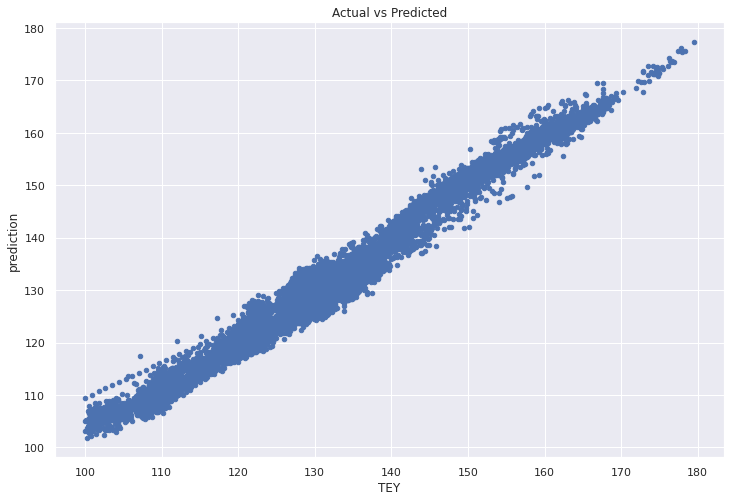

In [ ]:
a.plot.scatter(x='TEY', y='prediction',\
                      figsize=(12,8), grid=True, title='Actual vs Predicted')

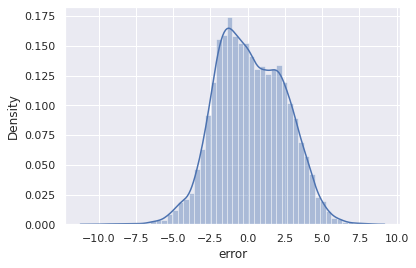

In [ ]:
sns.distplot(a['error'])

2020-11-14 11:49:58,185 - WARNING  - *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


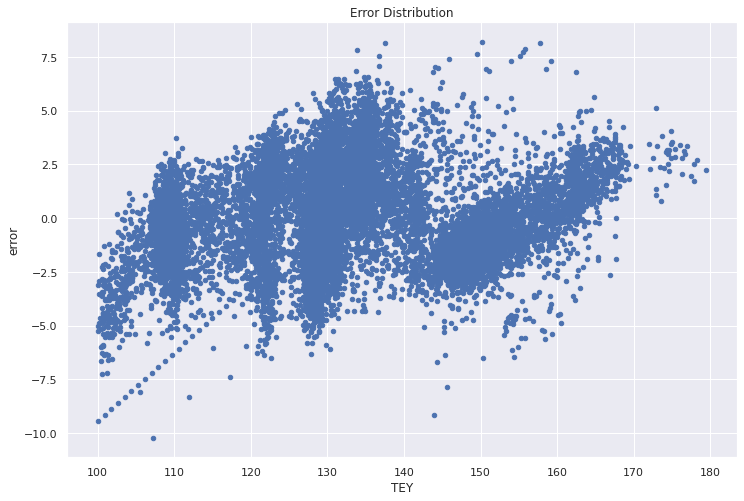

In [ ]:
a.plot.scatter(x='TEY', y='error',\
                      figsize=(12,8), grid=True, title='Error Distribution');

### Error values are normally distributed and variance are also same across , hence homoscedasticity has been concluded.

In [ ]:
a.to_csv('data_with_predictions.csv')

In [ ]:
from google.colab import files
a.to_csv('Thermal_Energy_Yield_Predictions.csv') 
files.download('Thermal_Energy_Yield_Predictions.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 6. Conclusion: 

- Feature selection is an important criterion when they are strongly correlated among each other.

- Search technique using RMSE and MAE for different number of features in train & test dataset is also an important factor while selecting a model.

- Homoscadasticity observed for the errors.

- This case study can also be referred for feature engineering.

<a id=section8></a>